In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/covidqu/COVID-QU-Ex dataset.txt
/kaggle/input/covidqu/Infection Segmentation Data/Infection Segmentation Data/Val/Non-COVID/lung masks/non_COVID (11184).png
/kaggle/input/covidqu/Infection Segmentation Data/Infection Segmentation Data/Val/Non-COVID/lung masks/non_COVID (4957).png
/kaggle/input/covidqu/Infection Segmentation Data/Infection Segmentation Data/Val/Non-COVID/lung masks/non_COVID (5020).png
/kaggle/input/covidqu/Infection Segmentation Data/Infection Segmentation Data/Val/Non-COVID/lung masks/non_COVID (4953).png
/kaggle/input/covidqu/Infection Segmentation Data/Infection Segmentation Data/Val/Non-COVID/lung masks/non_COVID (4917).png
/kaggle/input/covidqu/Infection Segmentation Data/Infection Segmentation Data/Val/Non-COVID/lung masks/non_COVID (4922).png
/kaggle/input/covidqu/Infection Segmentation Data/Infection Segmentation Data/Val/Non-COVID/lung masks/non_COVID (4942).png
/kaggle/input/covidqu/Infection Segmentation Data/Infection Segmentation Data/Val/Non

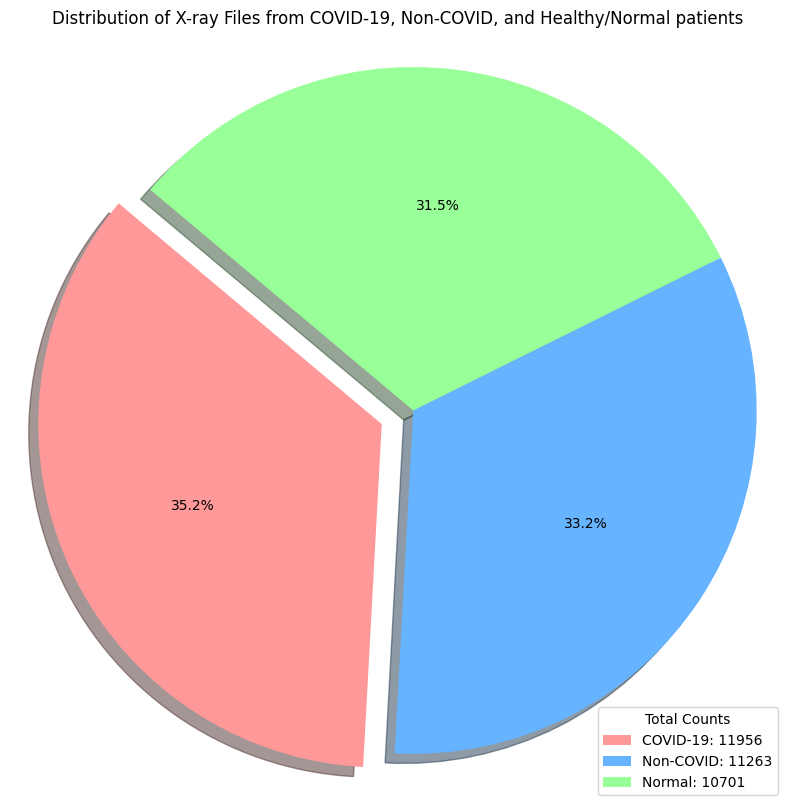

In [2]:
import os
import matplotlib.pyplot as plt

# Define the folder path
folder_path = '/kaggle/input/covidqu/Lung Segmentation Data/Lung Segmentation Data'

##Create a pie chart showing the distribution of data: Covid-19, Non-Covid and Normal Xray

# Initialize counters
covid_count = 0
non_covid_count = 0
normal_count = 0

# Define the subfolders
subfolders = ['Train', 'Test', 'Val']
categories = ['COVID-19', 'Non-COVID', 'Normal']

# Count the PNG files in each category
for subfolder in subfolders:
    for category in categories:
        image_folder = os.path.join(folder_path, subfolder, category, 'images')
        for file in os.listdir(image_folder):
            if file.endswith('.png'):
                if category == 'COVID-19':
                    covid_count += 1
                elif category == 'Non-COVID':
                    non_covid_count += 1
                elif category == 'Normal':
                    normal_count += 1

# Data for pie chart
labels = ['COVID-19', 'Non-COVID', 'Normal']
sizes = [covid_count, non_covid_count, normal_count]
colors = ['#ff9999','#66b3ff','#99ff99']
explode = (0.1, 0, 0)  # explode 1st slice

# Create a pie chart
plt.figure(figsize=(10, 10))
plt.pie(sizes, explode=explode, colors=colors, autopct='%1.1f%%',
        shadow=True, startangle=140)
plt.legend(labels, loc="best")
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Add legend
plt.legend(title="Total Counts", labels=[
    f'COVID-19: {covid_count}', 
    f'Non-COVID: {non_covid_count}', 
    f'Normal: {normal_count}'
], loc="lower right")

# Title
plt.title('Distribution of X-ray Files from COVID-19, Non-COVID, and Healthy/Normal patients')

# Show the plot
plt.show()



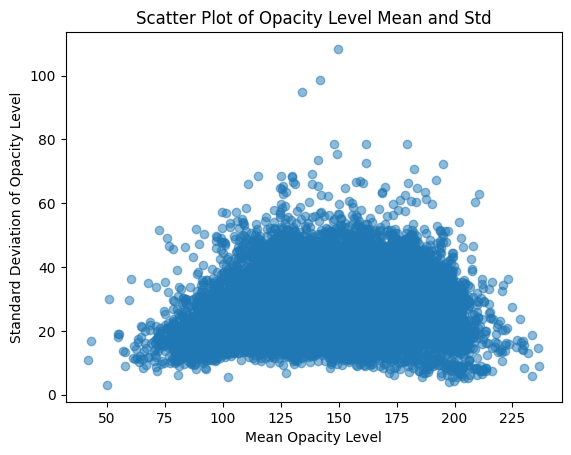

In [3]:
##Create Lung opacity: healthy vs covid vs pneumonia (scatter plot mean vs std)
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread

# Define the folder path
folder_path = '/kaggle/input/covidqu/Lung Segmentation Data/Lung Segmentation Data'

# Define the subfolders
subfolders = ['Train', 'Test', 'Val']
categories = ['COVID-19', 'Non-COVID', 'Normal']
subcategories = ['images', 'lung masks']

# Initialize lists to store mean and std values
means = []
stds = []

# Function to calculate mean and std of opacity levels
def calculate_opacity_stats(image_path, mask_path):
    image = imread(image_path, as_gray=True)
    mask = imread(mask_path, as_gray=True)
    masked_image = image * mask
    mean_opacity = np.mean(masked_image[mask > 0])
    std_opacity = np.std(masked_image[mask > 0])
    return mean_opacity, std_opacity

# Iterate through the folders and calculate stats
for subfolder in subfolders:
    for category in categories:
        image_folder = os.path.join(folder_path, subfolder, category, 'images')
        mask_folder = os.path.join(folder_path, subfolder, category, 'lung masks')
        for filename in os.listdir(image_folder):
            image_path = os.path.join(image_folder, filename)
            mask_path = os.path.join(mask_folder, filename)
            mean_opacity, std_opacity = calculate_opacity_stats(image_path, mask_path)
            means.append(mean_opacity)
            stds.append(std_opacity)

# Create scatter plot
plt.scatter(means, stds, alpha=0.5)
plt.title('Scatter Plot of Opacity Level Mean and Std')
plt.xlabel('Mean Opacity Level')
plt.ylabel('Standard Deviation of Opacity Level')
plt.show()


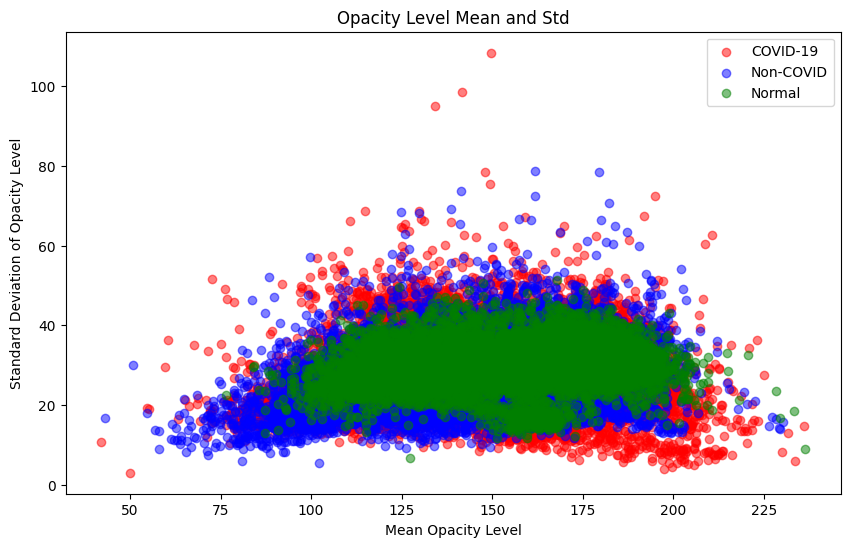

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread

# Define the folder path
folder_path = '/kaggle/input/covidqu/Lung Segmentation Data/Lung Segmentation Data'

# Define the subfolders
subfolders = ['Train', 'Test', 'Val']
categories = ['COVID-19', 'Non-COVID', 'Normal']
subcategories = ['images', 'lung masks']

# Initialize lists to store mean and std values and their corresponding categories
means = []
stds = []
labels = []

# Function to calculate mean and std of opacity levels
def calculate_opacity_stats(image_path, mask_path):
    image = imread(image_path, as_gray=True)
    mask = imread(mask_path, as_gray=True)
    masked_image = image * mask
    mean_opacity = np.mean(masked_image[mask > 0])
    std_opacity = np.std(masked_image[mask > 0])
    return mean_opacity, std_opacity

# Iterate through the folders and calculate stats
for subfolder in subfolders:
    for category in categories:
        image_folder = os.path.join(folder_path, subfolder, category, 'images')
        mask_folder = os.path.join(folder_path, subfolder, category, 'lung masks')
        for filename in os.listdir(image_folder):
            image_path = os.path.join(image_folder, filename)
            mask_path = os.path.join(mask_folder, filename)
            mean_opacity, std_opacity = calculate_opacity_stats(image_path, mask_path)
            means.append(mean_opacity)
            stds.append(std_opacity)
            labels.append(category)

# Create scatter plot with different colors for each category
colors = {'COVID-19': 'red', 'Non-COVID': 'blue', 'Normal': 'green'}
plt.figure(figsize=(10, 6))

for category in categories:
    category_means = [means[i] for i in range(len(means)) if labels[i] == category]
    category_stds = [stds[i] for i in range(len(stds)) if labels[i] == category]
    plt.scatter(category_means, category_stds, alpha=0.5, c=colors[category], label=category)

plt.title('Opacity Level Mean and Std')
plt.xlabel('Mean Opacity Level')
plt.ylabel('Standard Deviation of Opacity Level')
plt.legend()
plt.show()
